<a href="https://colab.research.google.com/github/noahgift/core-stats-datascience/blob/master/Lesson2_7_Trends_Supervized_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trends in Supervised Learning


*Source: [5]*
* 1800s–1980: linear models
 * Only option before computers
* 1980–1995: neural networks
 * Also called "multilayer perceptrons"
 * Successes limited to small data sets
* 1995–2010: linear models++
 * SVMs were new method of choice.
* 2010–???: neural networks
 * Neural net model improved speech recognition by 25%.
 
*Source: [6]*
* 2019- ???:  Machine Learning Developer Tooling 
 * [MLFlow](https://mlflow.org/):  An open source platform for the machine learning lifecycle
 * Model Explainability
 * Managed ML Systems:
   * [AWS Sagemaker](https://aws.amazon.com/sagemaker/) [Sketch IO Whiteboard]
 * AutoML
   * [H2O](http://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html)
   * [Ludwig](https://uber.github.io/ludwig/)
   * AutoML GCP
     * [AutoML Vision](https://cloud.google.com/vision/automl/docs/)
     * [AutoML Tables](https://cloud.google.com/automl-tables/)
  ![AutoML Tables](https://cloud.google.com/images/automl-tables/automl-table.svg)
  



# Comparing Classifiers

## Key Considerations

Factors other than accuracy: [5]

*   Interpretability
 *   SVMs are harder to understand than decision trees
* Model size
* Training/inference speed (think $$$)
* "No free lunch" theorem
 * No universally best classifier
  * A classifier may be the best for some problems but not others
  * You should try a few methods and see what works best
 



### sklearn classifier comparison

Automatically created module for IPython interactive environment


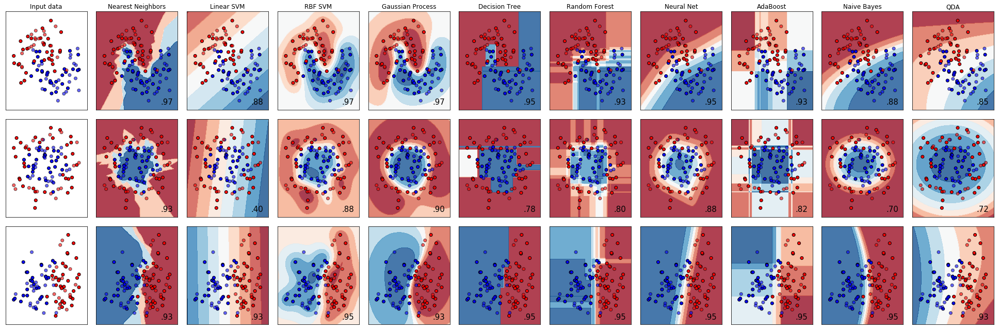

In [0]:
print(__doc__)


# Code source: Gaël Varoquaux
#              Andreas Müller
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

h = .02  # step size in the mesh

names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)

datasets = [make_moons(noise=0.3, random_state=0),
            make_circles(noise=0.2, factor=0.5, random_state=1),
            linearly_separable
            ]

figure = plt.figure(figsize=(27, 9))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.4, random_state=42)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        # Plot the decision boundary. For that, we will assign a color to each
        # point in the mesh [x_min, x_max]x[y_min, y_max].
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        i += 1

plt.tight_layout()
plt.show()

# Feature Engineering for Machine Learning in the Real-World

*Core Aspects of Machine Learning are*

**Models**

* mathmetical model describes relationship between data


**Features**

* numeric representation of raw data


## Feature Engineering

![Technical Debt](https://user-images.githubusercontent.com/58792/60345103-3bd51b00-9986-11e9-84c7-40a25fd2bf14.png)

## ML Technical Debt Takeaways

**Real World Machine Learning System**

![Technical Debt Takeaways](https://user-images.githubusercontent.com/58792/60346009-4395bf00-9988-11e9-8085-fb7a6e50ec24.jpeg)

*   **5%** of the code in an ML system is ML code [2]
*   (at least) **95%** is glue code [2]



## Feature Engineering in Practice

#### Permutation Importance



* [What features have the biggest impact on predictions?](https://www.kaggle.com/dansbecker/permutation-importance)



In [0]:
fifa = "https://raw.githubusercontent.com/noahgift/socialpowernba/master/FIFA%202018%20Statistics.csv"
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

data = pd.read_csv(fifa)
y = (data['Man of the Match'] == "Yes")  # Convert from string "Yes"/"No" to binary
feature_names = [i for i in data.columns if data[i].dtype in [np.int64]]
X = data[feature_names]
train_X, val_X, train_y, val_y = train_test_split(X, y, random_state=1)
my_model = RandomForestClassifier(random_state=0).fit(train_X, train_y)

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [0]:
X

,Goal Scored,Ball Possession %,Attempts,On-Target,Off-Target,Blocked,Corners,Offsides,Free Kicks,Saves,Pass Accuracy %,Passes,Distance Covered (Kms),Fouls Committed,Yellow Card,Yellow & Red,Red,Goals in PSO
0,5,40,13,7,3,3,6,3,11,0,78,306,118,22,0,0,0,0
1,0,60,6,0,3,3,2,1,25,2,86,511,105,10,0,0,0,0
2,0,43,8,3,3,2,0,1,7,3,78,395,112,12,2,0,0,0
3,1,57,14,4,6,4,5,1,13,3,86,589,111,6,0,0,0,0
4,0,64,13,3,6,4,5,0,14,2,86,433,101,22,1,0,0,0
5,1,36,8,2,5,1,2,0,22,2,86,194,100,14,3,0,0,0
6,3,39,8,3,2,3,4,1,13,2,87,366,102,12,1,0,0,0
7,3,61,12,5,5,2,5,3,13,0,93,727,103,10,1,0,0,0
8,2,51,12,5,4,3,5,0,19,1,87,484,103,16,1,0,0,0
9,1,49,4,1,2,1,1,0,16,4,85,390,111,19,3,0,0,0


eli5 feature importance

In [0]:
!pip install -q eli5

     |████████████████████████████████| 102kB 3.7MB/s 


In [0]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(my_model, random_state=1).fit(val_X, val_y)
eli5.show_weights(perm, feature_names = val_X.columns.tolist())

Weight,Feature
0.0750 ± 0.1159,Goal Scored
0.0625 ± 0.0791,Corners
0.0437 ± 0.0500,Distance Covered (Kms)
0.0375 ± 0.0729,On-Target
0.0375 ± 0.0468,Free Kicks
0.0187 ± 0.0306,Blocked
0.0125 ± 0.0750,Pass Accuracy %
0.0125 ± 0.0500,Yellow Card
0.0063 ± 0.0468,Saves
0.0063 ± 0.0250,Offsides


### Scaling Data

Scaling

* In some cases (e.g., linear regression), you don't need to worry about the scale of your features.
  * Linear regression has a closed-form algebraic solution.
* However, optimization usually follows an iterative procedure to refine feature weight estimates.
   * In these cases, your features should be roughly in the same scale.
   * **To be safe, apply mean and variance scaling to all feature values** before trying to fit model.
   * Mean scaling: Find the mean value of a particular feature and subtract the mean from each feature.
   * Variance scaling: Divide each feature by its standard deviation.

**DEMO: Example NBA Team Valuation**

In [0]:
import pandas as pd

team_data = "https://raw.githubusercontent.com/noahgift/socialpowernba/master/data/nba_2017_att_val_elo_win_housing.csv"
val_housing_win_df = pd.read_csv(team_data)
val_housing_win_df.head()

,TEAM,GMS,PCT_ATTENDANCE,WINNING_SEASON,TOTAL_ATTENDANCE_MILLIONS,VALUE_MILLIONS,ELO,CONF,COUNTY,MEDIAN_HOME_PRICE_COUNTY_MILLIONS,COUNTY_POPULATION_MILLIONS
0,Chicago Bulls,41,104,1,0.888882,2500,1519,East,Cook,269900.0,5.20
1,Dallas Mavericks,41,103,0,0.811366,1450,1420,West,Dallas,314990.0,2.57
2,Sacramento Kings,41,101,0,0.721928,1075,1393,West,Sacremento,343950.0,1.51
3,Miami Heat,41,100,1,0.805400,1350,1569,East,Miami-Dade,389000.0,2.71
4,Toronto Raptors,41,100,1,0.813050,1125,1600,East,York-County,390000.0,1.10


#### Data Preparation for Clustering

* Clustering on four columns:  Attendence, ELO, Valuation and Median Home Prices
* Scaling the data


In [0]:
numerical_df = val_housing_win_df.loc[:,["TOTAL_ATTENDANCE_MILLIONS", "ELO", "VALUE_MILLIONS", "MEDIAN_HOME_PRICE_COUNTY_MILLIONS"]]

In [0]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
print(scaler.fit(numerical_df))
print(scaler.transform(numerical_df))

MinMaxScaler(copy=True, feature_range=(0, 1))
[[1.         0.41898148 0.68627451 0.08776879]
 [0.72637903 0.18981481 0.2745098  0.11603661]
 [0.41067502 0.12731481 0.12745098 0.13419221]
 [0.70531986 0.53472222 0.23529412 0.16243496]
 [0.73232332 0.60648148 0.14705882 0.16306188]
 [0.62487072 0.68981481 0.49019608 0.31038806]
 [0.83819102 0.47916667 0.17647059 0.00476459]
 [0.6983872  1.         0.7254902  0.39188139]
 [0.49678606 0.47453704 0.10784314 0.04993825]
 [0.72417286 0.08333333 1.         1.        ]
 [0.54749962 0.57638889 0.56862745 0.23139615]
 [0.60477873 0.06712963 0.88235294 0.31038806]
 [0.65812204 0.52083333 0.11764706 0.184816  ]
 [0.52863955 0.74768519 0.16666667 0.08156228]
 [0.70957335 0.64583333 0.0627451  0.13983449]
 [0.43166712 0.03240741 0.06666667 0.10657639]
 [0.20301662 0.33333333 0.         0.10350448]
 [0.31881029 0.61111111 0.35294118 0.09062441]
 [0.36376665 0.00462963 0.1372549  0.10350448]
 [0.27883458 0.43518519 0.05098039 0.00946649]
 [0.25319364 0

In [0]:
from sklearn.cluster import KMeans
k_means = KMeans(n_clusters=3)
kmeans = k_means.fit(scaler.transform(numerical_df))
val_housing_win_df['cluster'] = kmeans.labels_
val_housing_win_df.head()

,TEAM,GMS,PCT_ATTENDANCE,WINNING_SEASON,TOTAL_ATTENDANCE_MILLIONS,VALUE_MILLIONS,ELO,CONF,COUNTY,MEDIAN_HOME_PRICE_COUNTY_MILLIONS,COUNTY_POPULATION_MILLIONS,cluster
0,Chicago Bulls,41,104,1,0.888882,2500,1519,East,Cook,269900.0,5.20,0
1,Dallas Mavericks,41,103,0,0.811366,1450,1420,West,Dallas,314990.0,2.57,0
2,Sacramento Kings,41,101,0,0.721928,1075,1393,West,Sacremento,343950.0,1.51,1
3,Miami Heat,41,100,1,0.805400,1350,1569,East,Miami-Dade,389000.0,2.71,0
4,Toronto Raptors,41,100,1,0.813050,1125,1600,East,York-County,390000.0,1.10,0


##### 3D Plot in R

![Valuation 3D Plot](https://user-images.githubusercontent.com/58792/36056809-7f87a266-0dbc-11e8-8877-9bb87905adbd.png)

Source Code:  https://github.com/noahgift/socialpowernba/blob/master/plot_team_cluster.R

### 3D Plot in Plotly

In [0]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

In [0]:
import plotly.offline as py
import plotly.graph_objs as go

from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

trace1 = go.Scatter3d(
    x=val_housing_win_df["VALUE_MILLIONS"],
    y=val_housing_win_df["ELO"],
    z=val_housing_win_df["MEDIAN_HOME_PRICE_COUNTY_MILLIONS"],
    mode='markers',
    text=val_housing_win_df["TEAM"],
    marker=dict(
        size=12,
        color=val_housing_win_df["cluster"],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)
#print(trace1)
data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Valuations NBA Teams (Clusters Colored)",
    scene = dict(
        xaxis = dict(title='X: VALUE_MILLIONS'),
        yaxis = dict(title="Y:  ELO"),
        zaxis = dict(title="Z:  MEDIAN_HOME_PRICE_COUNTY_MILLIONS"),
    ),
    width=1000,
    height=900,
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

### Bias

**There are many different sources of bias:**

* Unbalanced ratio of positive to negative examples
* This may cause the classifier to always pick the majority class.
* Mismatched sources
* Training procedure is focused on the training data provided.
* Algorithm won't work well with fundamentally different data.

### Key Takeaways

**Key Takeaways**

* If you have around 1,000 to 10,000 training examples, it’s worth trying more complex algorithms (e.g., SVMs, random forests).
* The more data you have, the harder it will be to beat logistic regression.
* Neural nets can discover useful features in complex inputs (e.g., images, speech).

**sklearn ml map**


![sklearn ml map](https://scikit-learn.org/stable/_static/ml_map.png)

# Case Studies

### Predict a Winning Team

In [0]:
import pandas as pd

player_data = "https://raw.githubusercontent.com/noahgift/socialpowernba/master/data/nba_2017_players_with_salary_wiki_twitter.csv"
df = pd.read_csv(player_data)
df.head()

,Unnamed: 0,Rk,PLAYER,POSITION,AGE,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,POINTS,TEAM,GP,MPG,ORPM,DRPM,RPM,WINS_RPM,PIE,PACE,W,SALARY_MILLIONS,PAGEVIEWS,TWITTER_FAVORITE_COUNT,TWITTER_RETWEET_COUNT
0,0,1,Russell Westbrook,PG,28,34.6,10.2,24.0,0.425,2.5,7.2,0.343,7.7,16.8,0.459,0.476,8.8,10.4,0.845,1.7,9.0,10.7,10.4,1.6,0.4,5.4,2.3,31.6,OKC,81,34.6,6.74,-0.47,6.27,17.34,23.0,102.31,46,26.50,4279.0,2130.5,559.0
1,1,2,James Harden,PG,27,36.4,8.3,18.9,0.440,3.2,9.3,0.347,5.1,9.6,0.530,0.525,9.2,10.9,0.847,1.2,7.0,8.1,11.2,1.5,0.5,5.7,2.7,29.1,HOU,81,36.4,6.38,-1.57,4.81,15.54,19.0,102.98,54,26.50,3279.0,969.0,321.5
2,2,4,Anthony Davis,C,23,36.1,10.3,20.3,0.505,0.5,1.8,0.299,9.7,18.6,0.524,0.518,6.9,8.6,0.802,2.3,9.5,11.8,2.1,1.3,2.2,2.4,2.2,28.0,NO,75,36.1,0.45,3.90,4.35,12.81,19.2,100.19,31,22.12,82.5,368.0,104.0
3,3,6,DeMarcus Cousins,C,26,34.2,9.0,19.9,0.452,1.8,5.0,0.361,7.2,14.8,0.483,0.498,7.2,9.3,0.772,2.1,8.9,11.0,4.6,1.4,1.3,3.7,3.9,27.0,NO/SAC,72,34.2,3.56,0.64,4.20,11.26,17.8,97.11,30,16.96,1625.5,102.0,91.5
4,4,7,Damian Lillard,PG,26,35.9,8.8,19.8,0.444,2.9,7.7,0.370,6.0,12.1,0.492,0.516,6.5,7.3,0.895,0.6,4.3,4.9,5.9,0.9,0.3,2.6,2.0,27.0,POR,75,35.9,4.63,-1.49,3.14,10.72,15.9,99.68,38,24.33,1830.5,186.5,43.0


#### Feature Engineering:  Create a new Feature...Winning Season

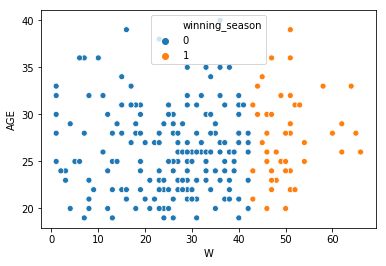

In [0]:
def winning_season(wins):
  
  if wins > 42:
      return 1
  return 0

df["winning_season"] = df["W"].apply(winning_season)

import seaborn as sns
sns.scatterplot(x="W", y="AGE", hue="winning_season", data=df)

### Predict Winning Season

In [0]:
df2 = df[["AGE", "POINTS", "SALARY_MILLIONS", "PAGEVIEWS", "TWITTER_FAVORITE_COUNT","winning_season", "TOV"]]
df = df2.dropna()
target = df["winning_season"]
features = df[["AGE", "POINTS","SALARY_MILLIONS", "PAGEVIEWS", "TWITTER_FAVORITE_COUNT", "TOV"]]
classes = ["winning", "losing"]

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.25, random_state=0)

Use Logistic Regression

In [0]:
from sklearn.linear_model import LogisticRegression

In [0]:
model = LogisticRegression()
model.fit(x_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

**Confusion Matrix**

* precision:  “for all instances classified positive, what percent was correct?”
* recall: "for all instances that were actually positive, what percent was classified correctly?""



/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



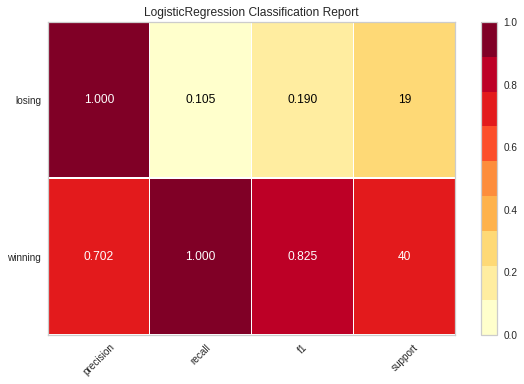

In [0]:
from yellowbrick.classifier import ClassificationReport
visualizer = ClassificationReport(model, classes=classes, support=True)
visualizer.fit(x_train, y_train)  # Fit the visualizer and the model
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

### Feature Ranking with Yellowbrick

/usr/local/lib/python3.6/dist-packages/yellowbrick/features/rankd.py:262: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



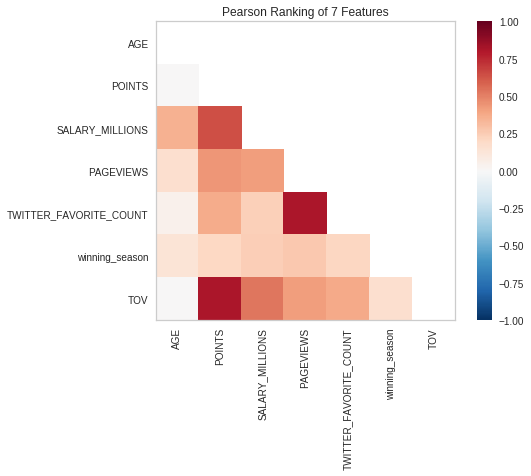

In [0]:
from yellowbrick.features import Rank2D

visualizer = Rank2D(algorithm="pearson")
visualizer.fit_transform(df)
visualizer.poof()

### Explain Model with shap

In [0]:
!pip install -q shap

In [0]:
import xgboost
import shap

model_xgboost = xgboost.train({"learning_rate": 0.01}, xgboost.DMatrix(x_train, label=y_train), 100)

# load JS visualization code to notebook
shap.initjs()

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model_xgboost)
shap_values = explainer.shap_values(features)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], features.iloc[0,:])

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version



Explain all of the features

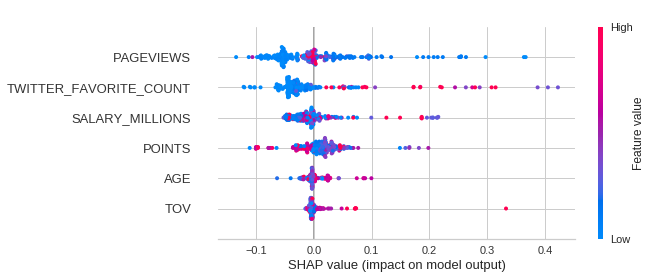

In [0]:
shap.summary_plot(shap_values, features)

bar plot

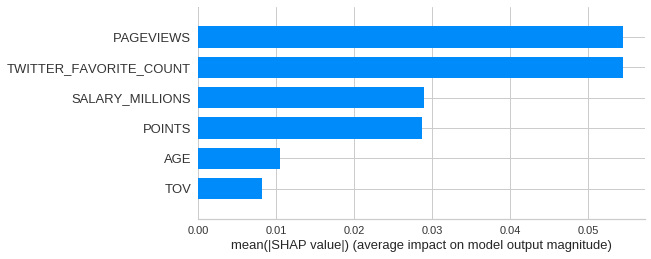

In [0]:
shap.summary_plot(shap_values, features, plot_type="bar")

#### ELI5 (Using Logistic Regression)

In [0]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(x_train, y_train)
eli5.show_weights(perm, feature_names = features.columns.tolist())

Weight,Feature
0.0192 ± 0.0197,POINTS
0.0192 ± 0.0136,AGE
0.0192 ± 0.0055,PAGEVIEWS
0.0169 ± 0.0071,SALARY_MILLIONS
0.0124 ± 0.0045,TOV
0.0102 ± 0.0085,TWITTER_FAVORITE_COUNT


### H20AutoML

#### Demo (Warning takes about 10 minutes to run)

Install H20

In [0]:
!pip install -q h2o

     |████████████████████████████████| 122.4MB 169kB/s 


In [0]:
import h2o
from h2o.automl import H2OAutoML

h2o.init()

# Import a sample binary outcome train/test set into H2O
train = h2o.import_file("https://s3.amazonaws.com/erin-data/higgs/higgs_train_10k.csv")
test = h2o.import_file("https://s3.amazonaws.com/erin-data/higgs/higgs_test_5k.csv")

# Identify predictors and response
x = train.columns
y = "response"
x.remove(y)

# For binary classification, response should be a factor
train[y] = train[y].asfactor()
test[y] = test[y].asfactor()

# Run AutoML for 20 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=20, seed=1)
aml.train(x=x, y=y, training_frame=train)

# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)  # Print all rows instead of default (10 rows)


Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.3" 2019-04-16; OpenJDK Runtime Environment (build 11.0.3+7-Ubuntu-1ubuntu218.04.1); OpenJDK 64-Bit Server VM (build 11.0.3+7-Ubuntu-1ubuntu218.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpawmaqs84
  JVM stdout: /tmp/tmpawmaqs84/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpawmaqs84/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,9 days
H2O cluster name:,H2O_from_python_unknownUser_0nu0yx
H2O cluster total nodes:,1
H2O cluster free memory:,3 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


model_id,auc,logloss,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_AutoML_20190628_215721,0.789237,0.552038,0.320475,0.43245,0.187013
StackedEnsemble_BestOfFamily_AutoML_20190628_215721,0.78753,0.553883,0.336221,0.433203,0.187665
XGBoost_grid_1_AutoML_20190628_215721_model_3,0.784588,0.558405,0.319401,0.435012,0.189235
XGBoost_1_AutoML_20190628_215721,0.782782,0.557031,0.331908,0.43506,0.189277
XGBoost_grid_1_AutoML_20190628_215721_model_4,0.782774,0.558375,0.316151,0.435543,0.189697
XGBoost_3_AutoML_20190628_215721,0.782434,0.563499,0.340872,0.437216,0.191158
XGBoost_grid_1_AutoML_20190628_215721_model_1,0.781904,0.561904,0.342042,0.43668,0.19069
XGBoost_2_AutoML_20190628_215721,0.781621,0.559814,0.326049,0.436018,0.190112
GBM_5_AutoML_20190628_215721,0.780837,0.559903,0.340848,0.436191,0.190263
GBM_2_AutoML_20190628_215721,0.780036,0.559806,0.339926,0.436415,0.190458


In [0]:
aml.predict?

# References

1.    [Place of Feature Engineering in Machine Learning Workflow](https://learning.oreilly.com/library/view/feature-engineering-for/9781491953235/ch01.html#ch-intro)

2.  [Hidden Technical Debt in Machine Learning Systems](https://papers.nips.cc/paper/5656-hidden-technical-debt-in-machine-learning-systems.pdf)
3.  [Data Engineer to Data Scientist](https://www.oreilly.com/ideas/data-engineers-vs-data-scientists)
4.  [Classifier comparison](https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html)
5.  Daniel Gillick, UC Berkeley
6.  [Biggest Trends in ML](https://www.forbes.com/sites/quora/2019/04/16/what-are-the-biggest-machine-learning-trends-of-2019/#7c862e60500d)
7.  [Model Explainability](https://towardsdatascience.com/why-model-explainability-is-the-next-data-science-superpower-b11b6102a5e0)
8.  [Model Explainability Course](https://www.kaggle.com/learn/machine-learning-explainability)
9.  [Shap](https://github.com/slundberg/shap)
10.  [Social Power NBA](https://github.com/noahgift/socialpowernba)
11  [H20 AutoML](http://docs.h2o.ai/h2o/latest-stable/h2o-docs/data-science.html)
12. [GCP AutoML Tables](https://cloud.google.com/automl-tables)/